*Content of this notebook*: this contains the main downstream analysis of the integrated dataset with WT, partial and full HOX KO. This includes DEG analysis (Wilcoxon) and several types of plots of normalized expression of specific genes. 

## Load the annotated dataset with the integrated samples 



In [1]:
import os

In [2]:
!conda info --envs

# conda environments:
#
base                     C:\Users\aleja\anaconda3
CommonOperations         C:\Users\aleja\anaconda3\envs\CommonOperations
singlecellEnv            C:\Users\aleja\anaconda3\envs\singlecellEnv
textenv               *  C:\Users\aleja\anaconda3\envs\textenv



In [3]:
os. getcwd() 

'D:\\BIOINFO\\POURQUIE\\HOX_project\\Analysis_SCANPY\\SCRIPTS_for_GitHub\\SUBMISSION_SCRIPTS'

In [4]:
import numpy as np
import pandas as pd
import scanpy as sc
import gseapy
import matplotlib.pyplot as plt
import seaborn as sns


In [5]:
sc.settings.verbosity = 3            
sc.logging.print_versions()  #updated scanpy to 1.10
sc.settings.set_figure_params(dpi=80, facecolor='white')

-----
anndata     0.10.7
scanpy      1.10.0
-----
PIL                         8.4.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
babel                       2.14.0
backcall                    0.2.0
bottleneck                  1.3.7
brotli                      NA
certifi                     2024.08.30
cffi                        1.16.0
chardet                     5.2.0
charset_normalizer          3.3.2
cloudpickle                 3.0.0
colorama                    0.4.6
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
cytoolz                     0.12.3
dask                        2024.2.0
dateutil                    2.8.2
debugpy                     1.8.1
decorator                   5.1.1
defusedxml                  0.7.1
exceptiongroup              1.2.0
executing                   2.0.1
fastjsonschema              NA

In [6]:
adata = sc.read_h5ad("D:/BIOINFO/POURQUIE/HOX_project/Analysis_SCANPY/H5AD/20241113_HOXsamples_all_qc_filtered_dr_Harmony_clustered_anno.h5ad")

In [7]:
# check that the matrix looks like normalized counts
print(adata.X[1:10,1:10])


  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


In [8]:
print(adata.raw.X[1:10,1:10]) 

  (0, 6)	0.547740638256073
  (3, 4)	0.33367305994033813
  (8, 4)	0.2874073386192322
  (8, 6)	0.510386049747467


#### Plotting UMAP by genotype

WT


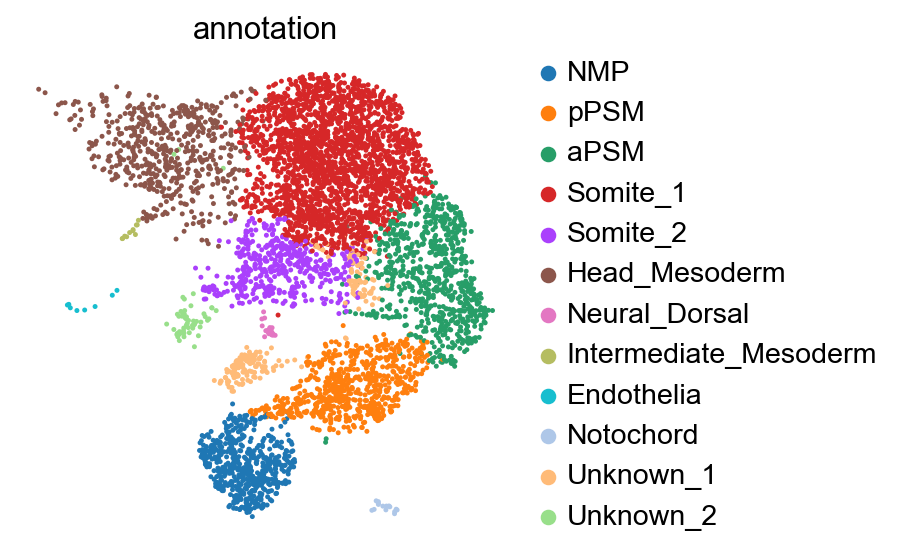

HOXD_KO


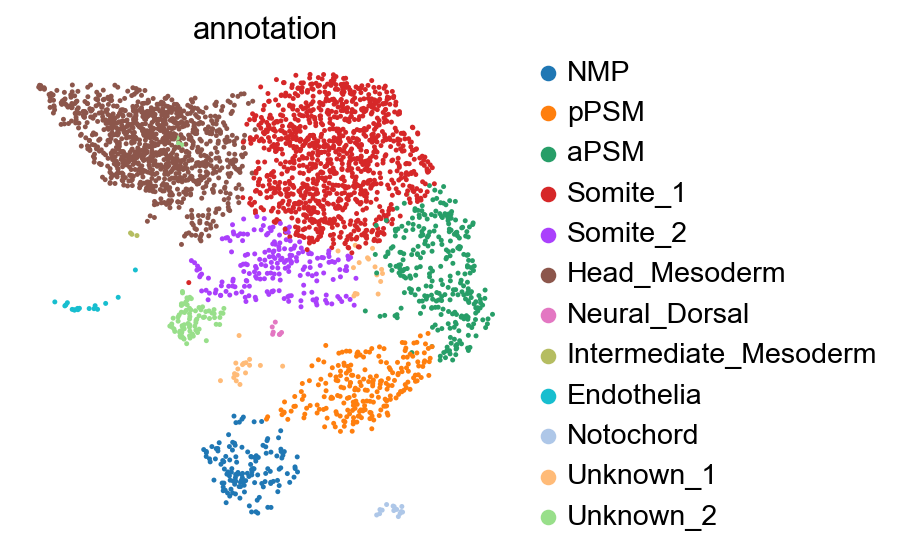

HOXBCD_KO


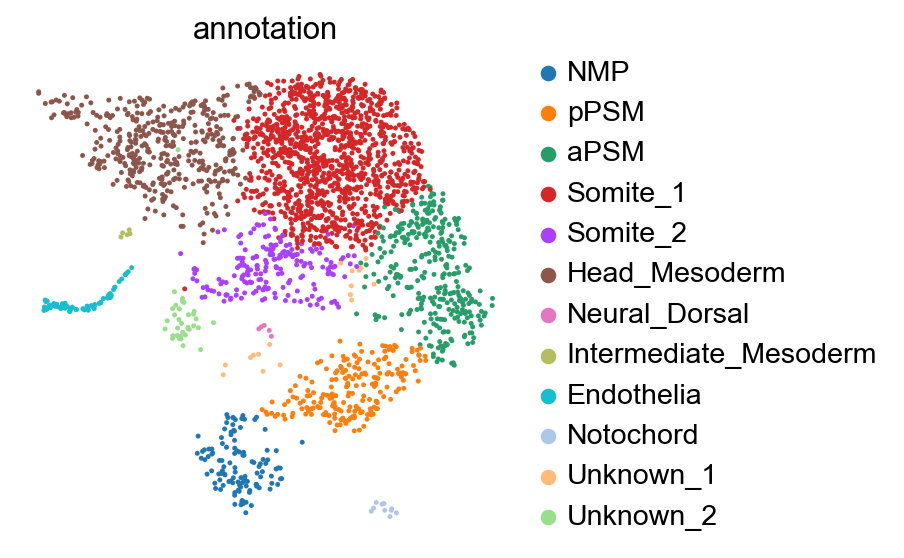

HOXCD_KO


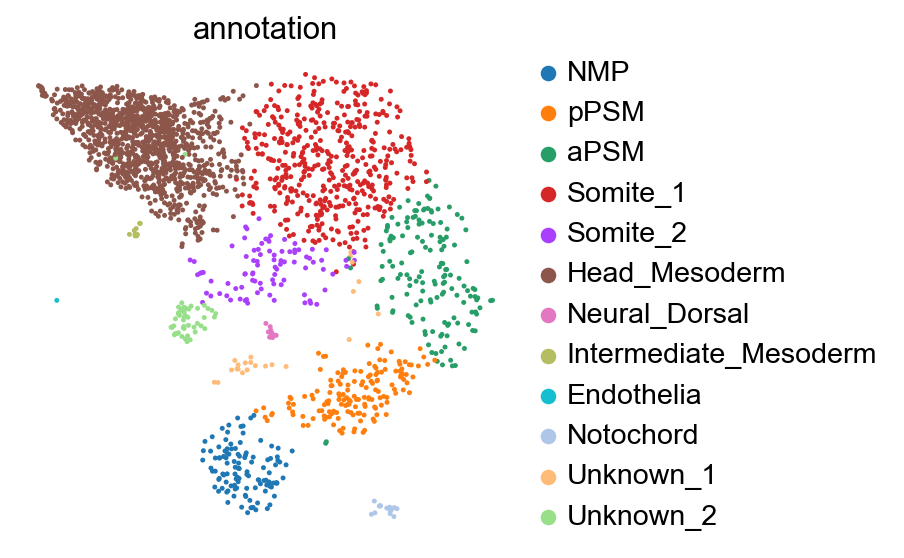

HOX_KO


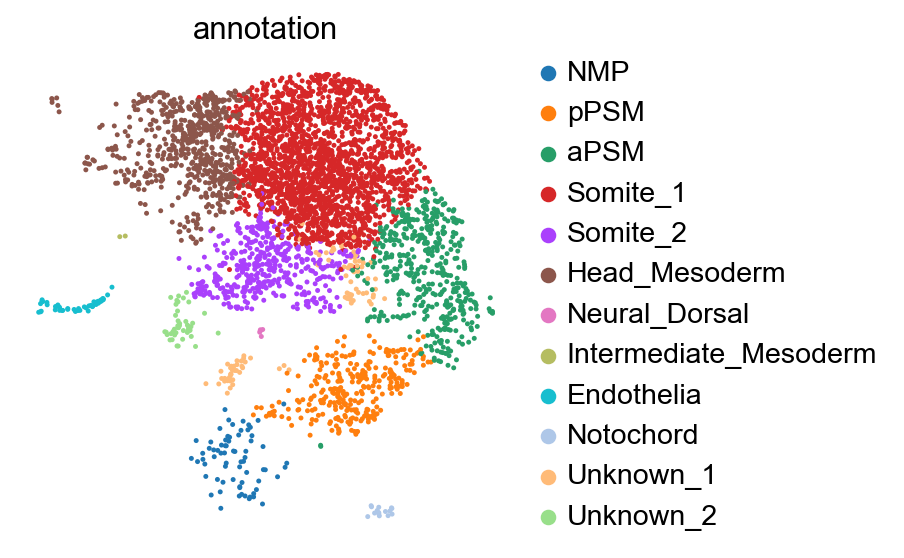

In [9]:
for i in ['WT', 'HOXD_KO','HOXBCD_KO','HOXCD_KO','HOX_KO']:
    print(i)
    sc.pl.umap(
    adata[adata.obs["sample"] == i], size=20,
    color=["annotation"],
    frameon=False,
    #save=f'20241113_UMAP_annotation_integrated_{i}.pdf'
    )

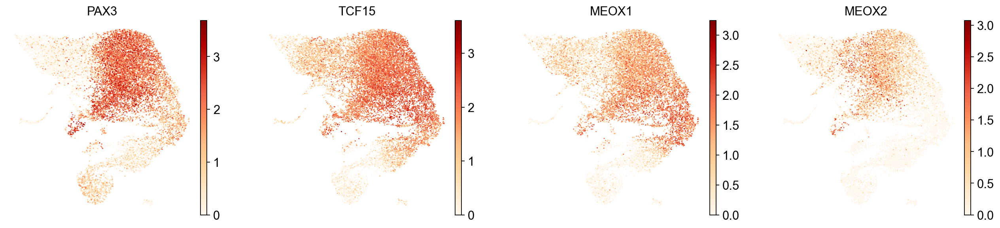

In [10]:
sc.pl.umap(adata, color=["PAX3", "TCF15","MEOX1","MEOX2"],color_map ="OrRd",frameon=False)  # cluster Somite_1, 2 express PAX3 and MEOX2

### HOX gene expression per sample

In [11]:
hox_genes= ["HOXA1","HOXA2", "HOXA3", "HOXA4", "HOXA5","HOXA6","HOXA7","HOXA9", "HOXA10", "HOXA13", #'HOXA8', "HOXA11","HOXA12" not expressed
            "HOXB1","HOXB2", "HOXB3", "HOXB4", "HOXB5","HOXB6","HOXB7","HOXB8", "HOXB9", "HOXB13",  # "HOXB10","HOXB11","HOXB12" not expressed
            "HOXC4", "HOXC5","HOXC6", "HOXC8", "HOXC9","HOXC10",'HOXC13', # 'HOXC1','HOXC2', 'HOXC3',  'HOXC7', 'HOXC11', 'HOXC12' not expressed
            "HOXD1", "HOXD3", "HOXD4", "HOXD8", "HOXD9","HOXD13" # 'HOXD2', 'HOXD5', 'HOXD6', 'HOXD7', 'HOXD10', 'HOXD11', 'HOXD12', not expressed
           ]

WT


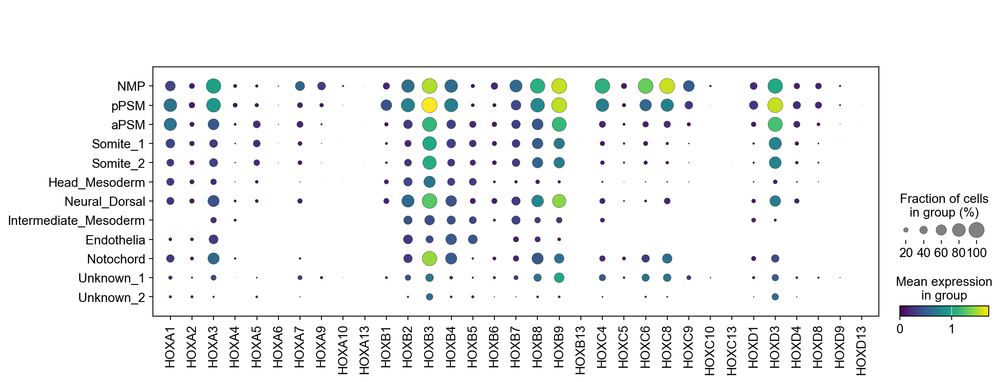

HOXD_KO


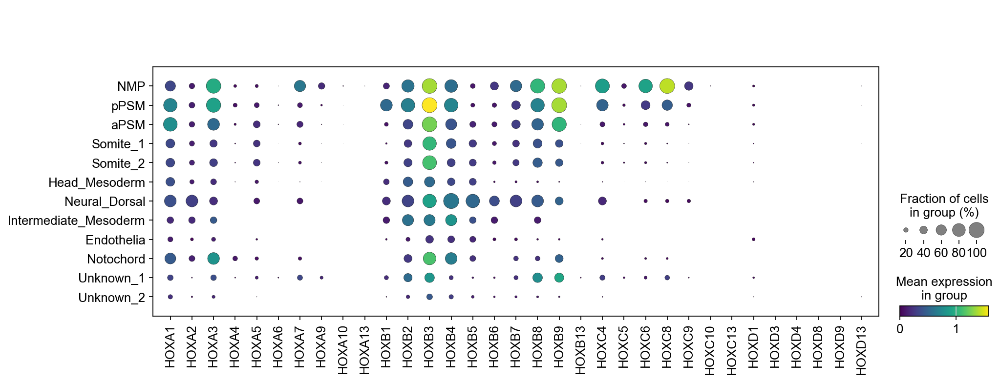

HOXBCD_KO


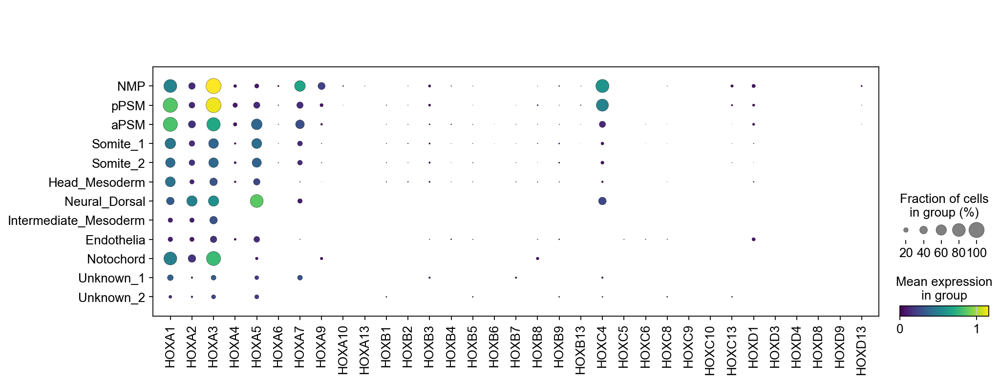

HOXCD_KO


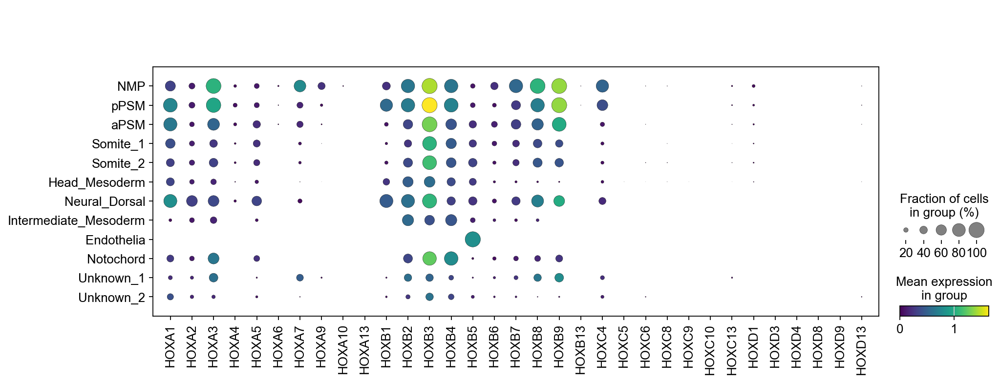

HOX_KO


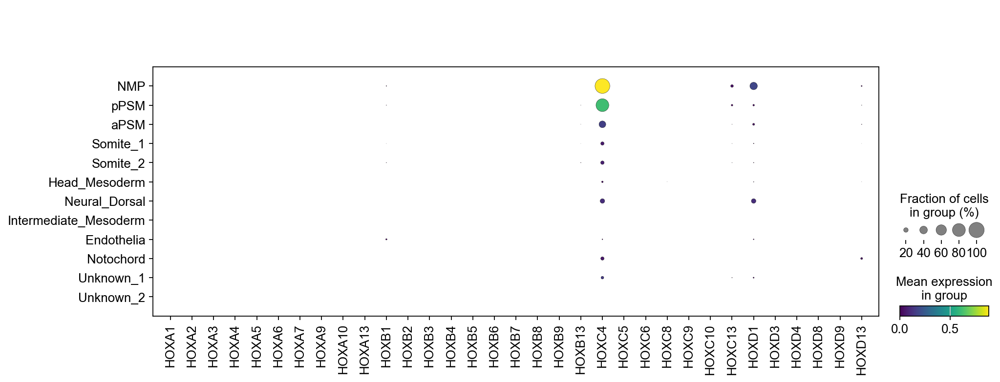

In [12]:
# Loop through each sample and plot a dot plot for the gene cluster
for i in ['WT', 'HOXD_KO', 'HOXBCD_KO', 'HOXCD_KO', 'HOX_KO']:
    print(i)
    sc.pl.dotplot(
        adata[adata.obs["sample"] == i],  # Subset the data for each sample
        var_names= hox_genes,           # Genes in the cluster
        groupby="annotation",             # Group by annotation
        color_map="viridis",             # Choose a color map
        #save=f'20241210_HOXsamples_dotplot_HOX_genes_orderedbycluster_{i}_allclusters.pdf'
    )

Scaled version:

WT


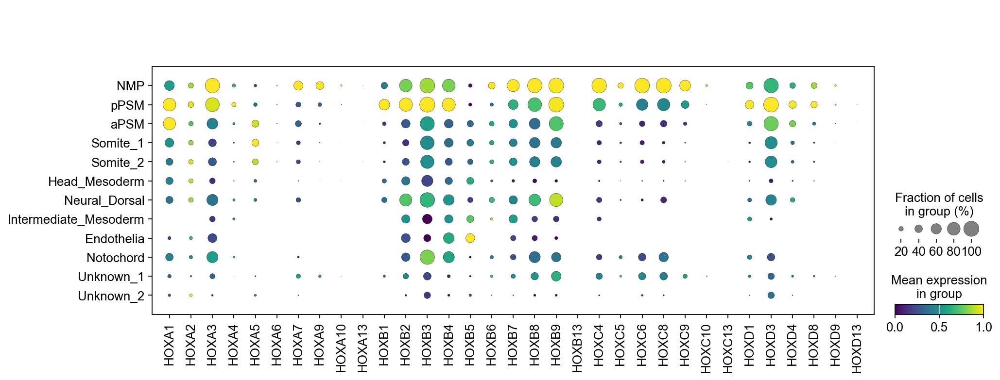

HOXD_KO


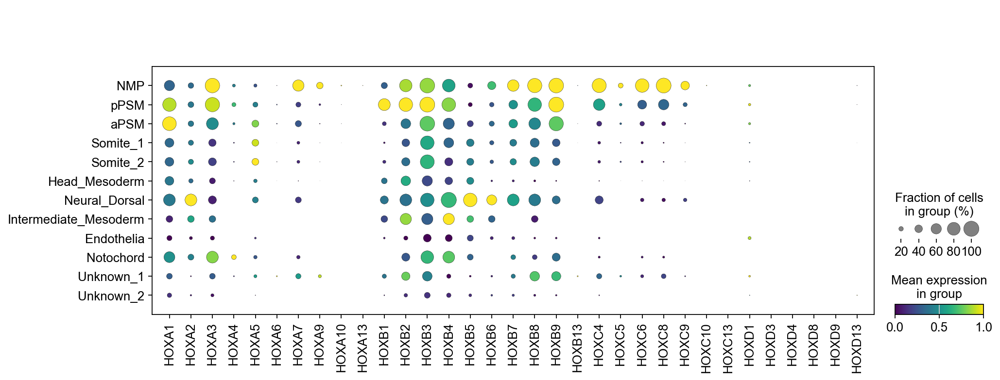

HOXBCD_KO


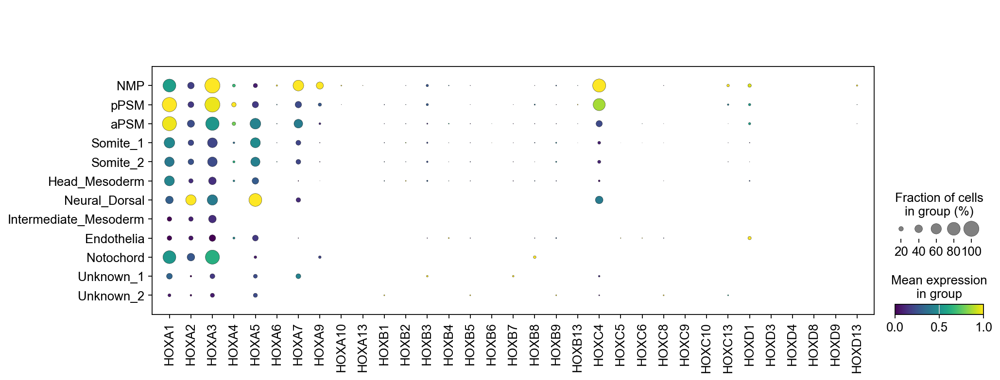

HOXCD_KO


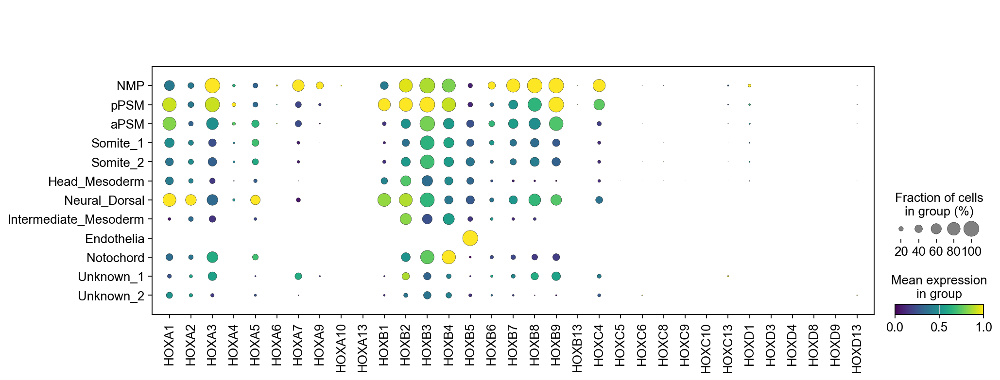

HOX_KO


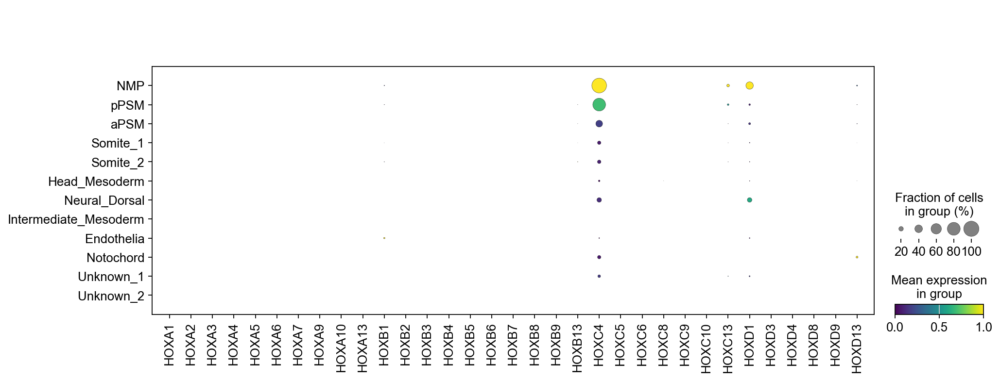

In [13]:
# Loop through each sample and plot a dot plot for the gene cluster
for i in ['WT', 'HOXD_KO', 'HOXBCD_KO', 'HOXCD_KO', 'HOX_KO']:
    print(i)
    sc.pl.dotplot(
        adata[adata.obs["sample"] == i],  # Subset the data for each sample
        var_names= hox_genes,           # Genes in the cluster
        groupby="annotation",             # Group by annotation
        color_map="viridis",             # Choose a color map
        standard_scale="var",             # Scale each gene independently for comparison
        #save=f'20241210_HOXsamples_dotplot_HOX_genes_orderedbycluster_{i}_allclusters_std.pdf'
    )

## DEG Analysis

In [14]:
# For DEG analysis we are going to subset the PSM-related clusters

In [15]:
adata_subset = adata[adata.obs['annotation'].isin(['NMP', 'pPSM','aPSM',"Somite_1",
                     'Somite_2', 'Head_Mesoderm'])].copy() # we subset the most relevant clusters for further analysis 

In [16]:
# For simplicity we will fuse the somite clusters

In [17]:
adata_subset.obs['annotation_short'] = (
    adata_subset.obs["annotation"]
    .map(lambda x: {"Somite_1": "Somite", "Somite_2": "Somite"}.get(x, x))
    .astype("category")
)

In [18]:
adata_subset.obs['annotation_short'] = adata_subset.obs['annotation_short'].cat.reorder_categories(['NMP','pPSM','aPSM','Somite',
                     'Head_Mesoderm'])

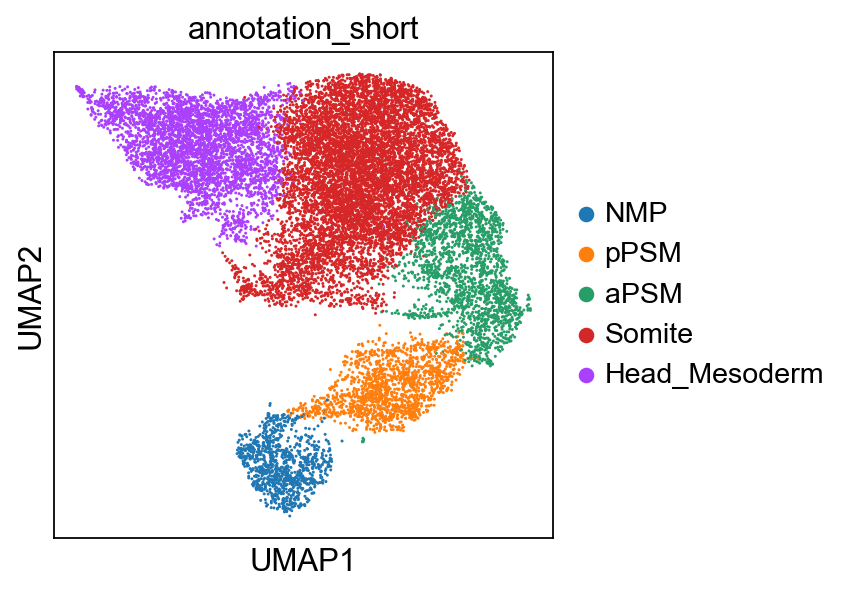

In [19]:
sc.pl.umap(adata_subset, color= "annotation_short") 

In [20]:
# As we only intend to do DEG comparing HOX_KO vs WT, let's substract them:
samples_of_interest = ['WT', 'HOX_KO']

# Create a new AnnData object with only the two samples
adata_WT_HOXKO = adata_subset[adata_subset.obs['sample'].isin(samples_of_interest)].copy()

In [21]:
NMP = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'NMP',:].copy()
pPSM = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'pPSM',:].copy()
aPSM = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'aPSM',:].copy()
Somite = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'Somite',:].copy()
Head_Mesoderm = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'Head_Mesoderm',:].copy()


## NMP

In [22]:
NMP.obs['sample'].value_counts()

sample
WT        574
HOX_KO     70
Name: count, dtype: int64

ranking genes
    finished: added to `.uns['DEG']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


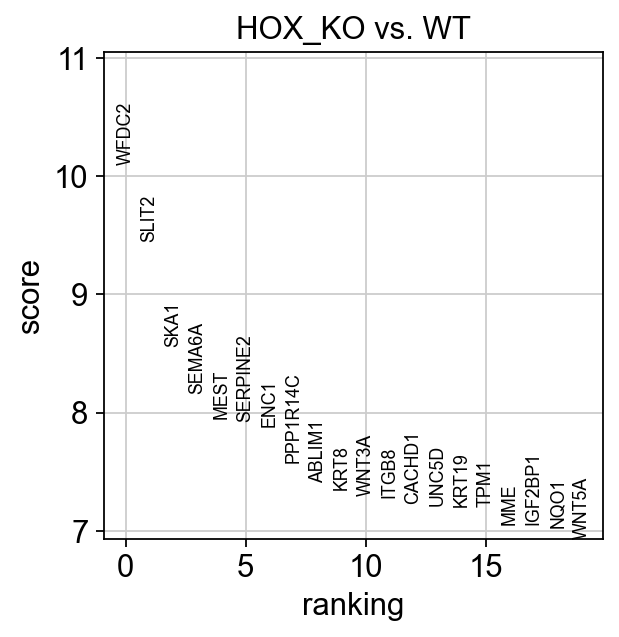

In [23]:
sc.tl.rank_genes_groups(NMP, 'sample', reference="WT",method='wilcoxon', key_added = "DEG")
sc.pl.rank_genes_groups(NMP, n_genes=20, sharey=False, key="DEG")

In [24]:
# getting the list of DEG
result = NMP.uns['DEG']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
#df.to_csv('CSV/20241113_NMP_HOXKOvsWT_allDEG_wilcoxon.csv')

In [25]:
def rank_genes_groups_df(adata, group, pval_cutoff : float =0.05, logfc_cutoff=0.58): 
    d = pd.DataFrame() 
    for k in ['scores', 'names', 'logfoldchanges', 'pvals', 'pvals_adj']: 
        d[k] = adata.uns["DEG"][k][group] 
    if pval_cutoff is not None: 
        d = d[d["pvals_adj"] <= pval_cutoff] 
    if logfc_cutoff is not None: 
        d = d[d["logfoldchanges"].abs() >= logfc_cutoff] 
    return d

In [26]:
NMP_df = rank_genes_groups_df(NMP,"HOX_KO")  
# NMP_df.to_csv('CSV/20241113_NMP_HOXKOvsWT_DEGparsed_005_wilcoxon.csv')

## PSM

In [27]:
pPSM.obs['sample'].value_counts()

sample
WT        651
HOX_KO    287
Name: count, dtype: int64

ranking genes
    finished: added to `.uns['DEG']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


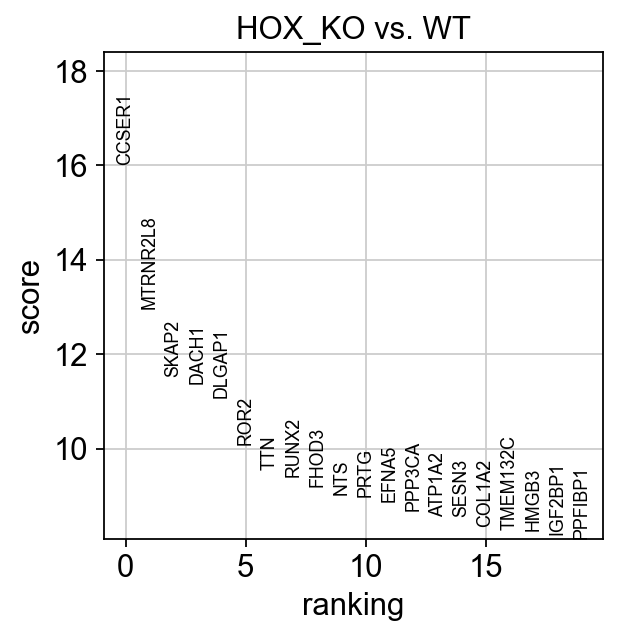

In [28]:
sc.tl.rank_genes_groups(pPSM, 'sample', reference="WT",method='wilcoxon', key_added = "DEG")
sc.pl.rank_genes_groups(pPSM, n_genes=20, sharey=False, key="DEG")

In [29]:
# getting the list of DEG
result = pPSM.uns['DEG']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
#df.to_csv('CSV/20241113_pPSM_HOXKOvsWT_allDEG_wilcoxon.csv')

In [30]:
PSM_df = rank_genes_groups_df(pPSM,"HOX_KO")
#PSM_df.to_csv('CSV/20241113_pPSM_HOXKOvsWT_parsed_005_wilcoxon.csv')

## anterior PSM

In [31]:
aPSM.obs['sample'].value_counts()

sample
WT        738
HOX_KO    437
Name: count, dtype: int64

ranking genes
    finished: added to `.uns['DEG']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


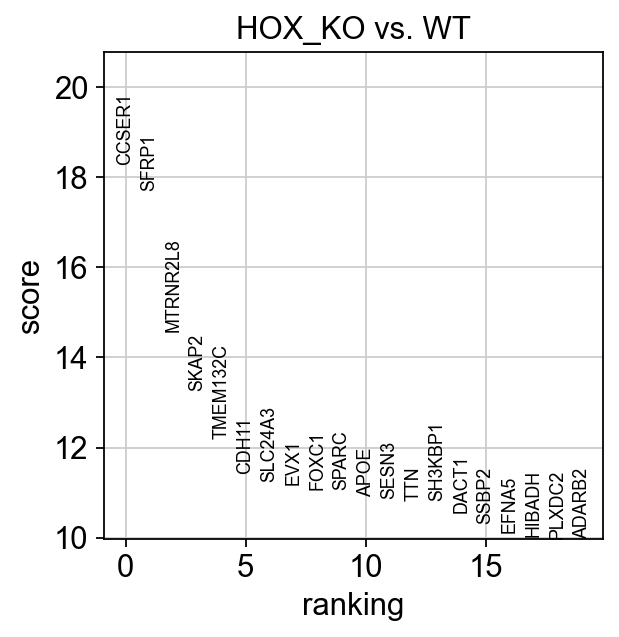

In [32]:
sc.tl.rank_genes_groups(aPSM, 'sample', reference="WT",method='wilcoxon', key_added = "DEG")
sc.pl.rank_genes_groups(aPSM, n_genes=20, sharey=False, key="DEG")

In [33]:
# getting the list of DEG
result = aPSM.uns['DEG']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
#df.to_csv('CSV/20241113_anterior_PSM_HOXKOvsWT_allDEG_wilcoxon.csv')

In [34]:
aPSM_df = rank_genes_groups_df(aPSM,"HOX_KO")
#aPSM_df.to_csv('CSV/20241113_anterior_PSM_HOXKOvsWT_parsed_005_wilcoxon.csv')

## Somite

In [35]:
Somite.obs['sample'].value_counts()

sample
WT        2704
HOX_KO    2479
Name: count, dtype: int64

ranking genes
    finished: added to `.uns['DEG']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:18)


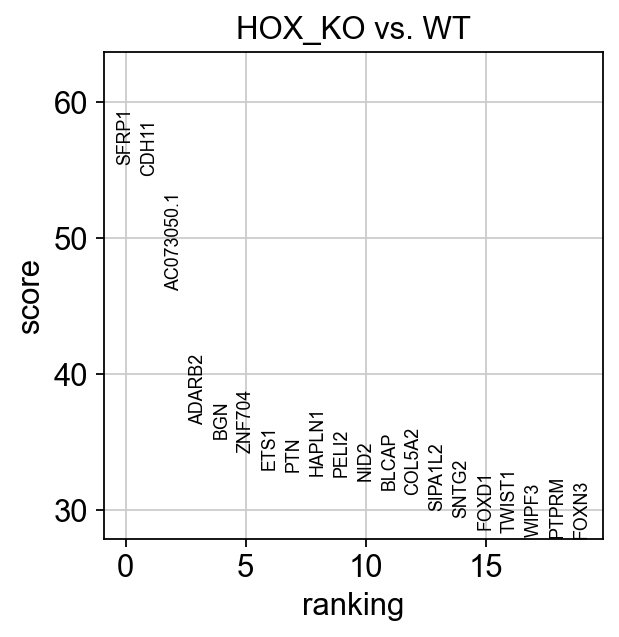

In [36]:
sc.tl.rank_genes_groups(Somite, 'sample', reference="WT",method='wilcoxon', key_added = "DEG")
sc.pl.rank_genes_groups(Somite, n_genes=20, sharey=False, key="DEG")

In [37]:
# getting the list of DEG
result = Somite.uns['DEG']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
#df.to_csv('CSV/20241113_Somite_HOXKOvsWT_allDEG_wilcoxon.csv')

In [38]:
Somite_df = rank_genes_groups_df(Somite,"HOX_KO")
#Somite_df.to_csv('CSV/20241113_Somite_HOXKOvsWT_parsed_005_wilcoxon.csv')

## Head Mesoderm cluster

In [39]:
Head_Mesoderm.obs['sample'].value_counts()

sample
HOX_KO    638
WT        542
Name: count, dtype: int64

ranking genes
    finished: added to `.uns['DEG']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


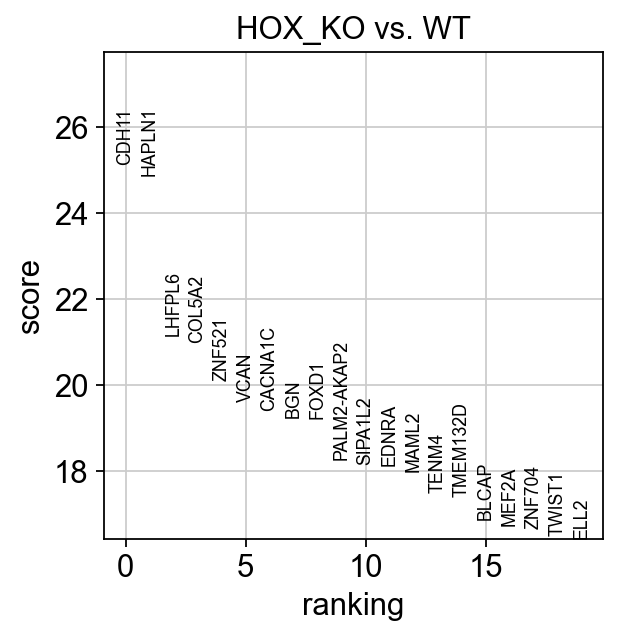

In [40]:
sc.tl.rank_genes_groups(Head_Mesoderm, 'sample', reference="WT",method='wilcoxon', key_added = "DEG")
sc.pl.rank_genes_groups(Head_Mesoderm, n_genes=20, sharey=False, key="DEG")

In [41]:
# getting the list of DEG
result = Head_Mesoderm.uns['DEG']
groups = result['names'].dtype.names
df = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
for group in groups for key in ['names','logfoldchanges','pvals','pvals_adj']})
#df.to_csv('CSV/20241113_Head_Mesoderm_HOXKOvsWT_allDEG_wilcoxon.csv')

In [42]:
Head_Mesoderm_df = rank_genes_groups_df(Head_Mesoderm,"HOX_KO")
#Head_Mesoderm_df.to_csv('CSV/20241113_Head_Mesoderm_HOXKOvsWT_parsed_005_wilcoxon.csv')

## Plotting RA-related genes

In [43]:
retinoic_acid_genes = [
    "RARB",    
    "CYP26A1", 
    "ALDH1A2", 
    "RBP4",   
    "CRABP1",  
    "CRABP2",  
    "RDH10", 
    "DHRS3", 
    "STRA6"
]

In [44]:
additional_genes = [ "TBXT", "FGF4", "FGF17", "BMP7", "TGFB1", "WNT3A", "WNT5A","WNT8A", "RSPO3", "DRAXIN", "SFRP2", "PAX3", "FN1","MEST"]

In [45]:
TUBB_genes= ["TUBB","TUBA1A","TUBA1B","TUBB2A","TUBB2B","TUBB3","TUBB4B"]

['RARB', 'CYP26A1', 'ALDH1A2', 'RBP4', 'CRABP1', 'CRABP2', 'RDH10', 'DHRS3', 'STRA6']
RARB


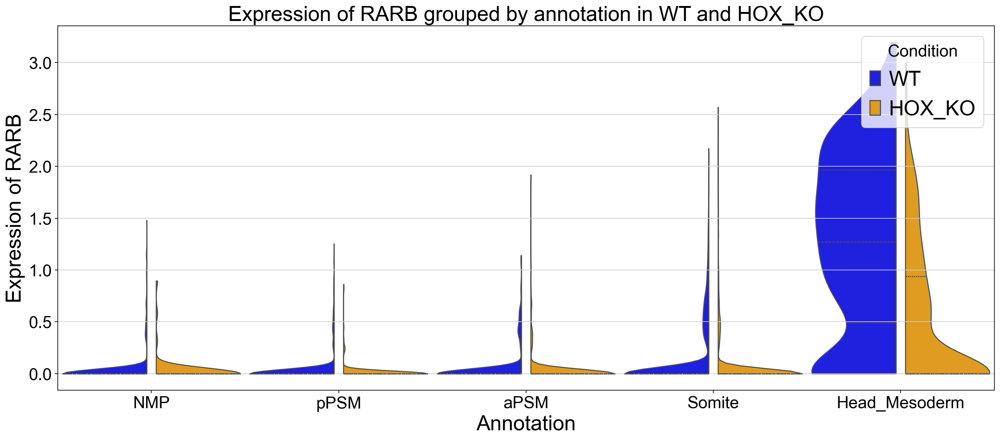

CYP26A1


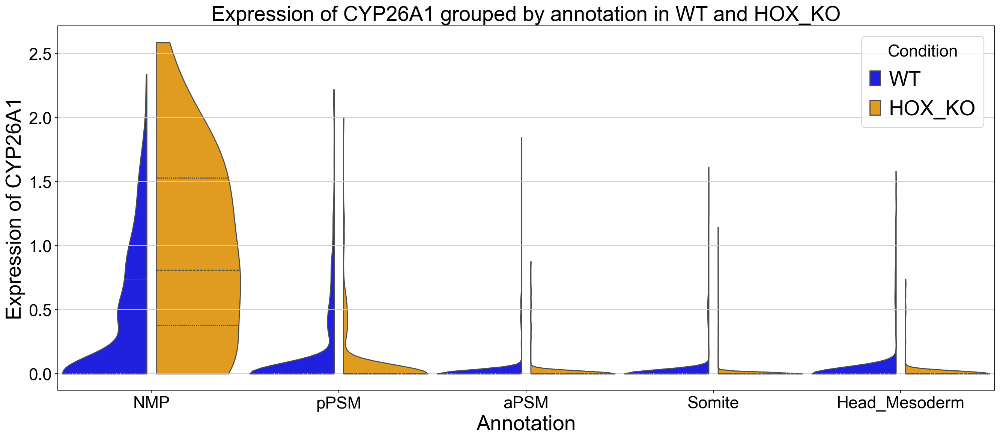

ALDH1A2


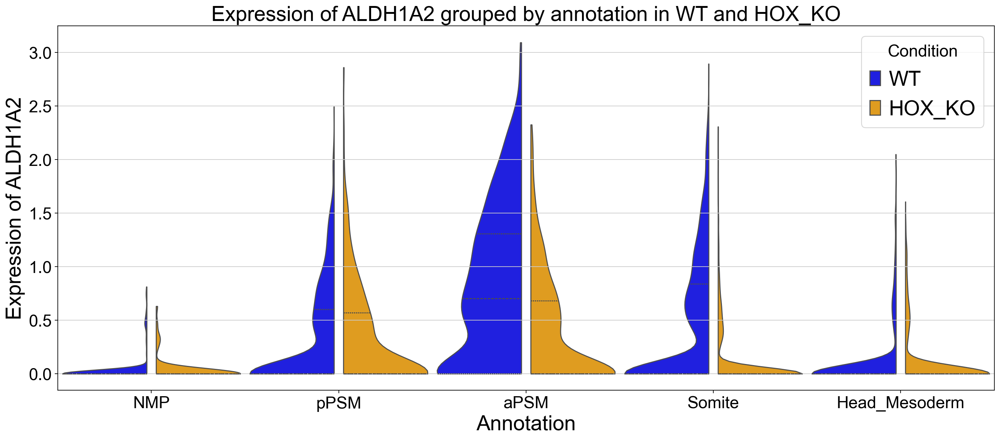

RBP4


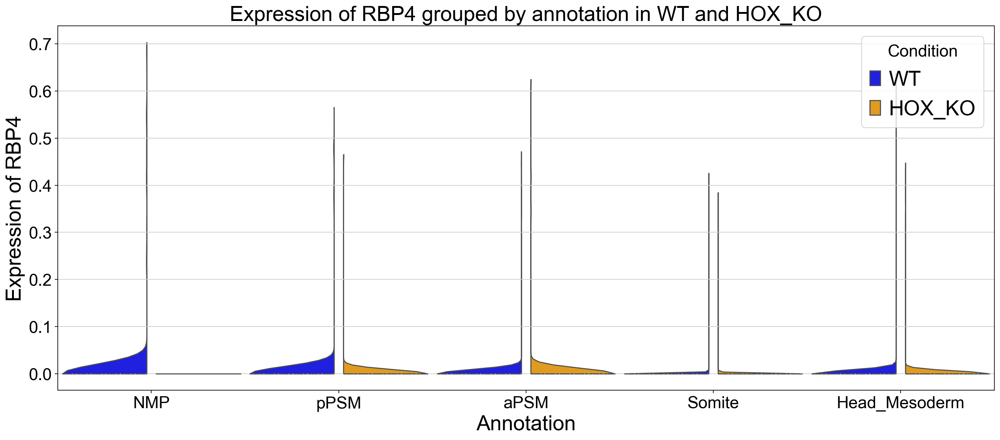

CRABP1


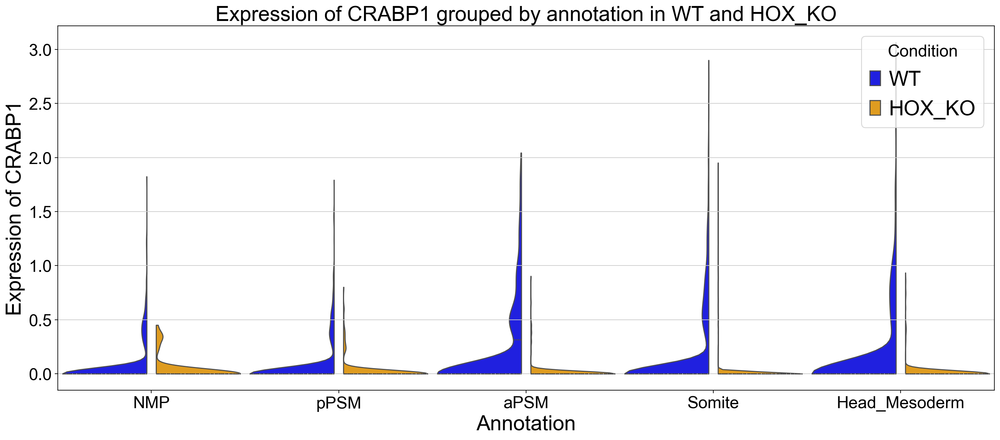

CRABP2


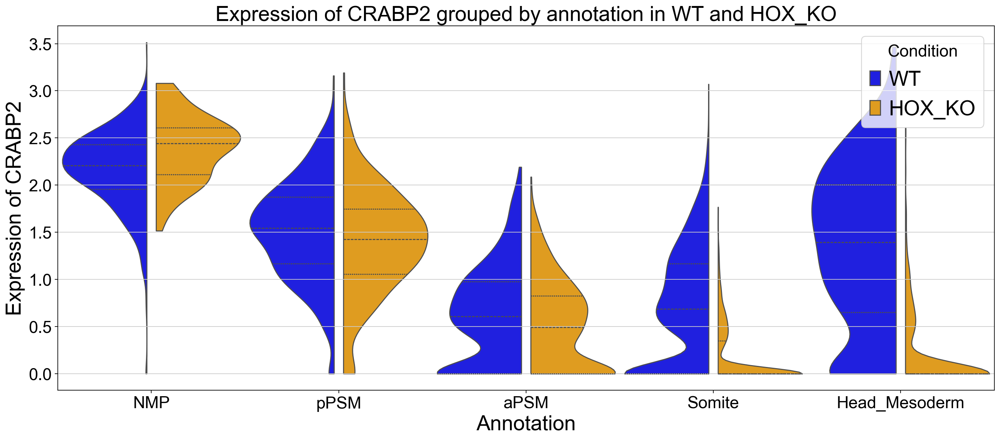

RDH10


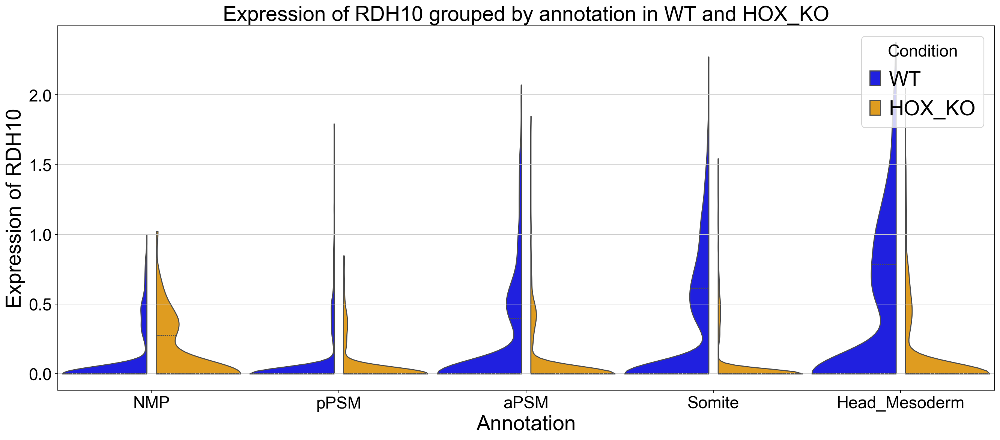

DHRS3


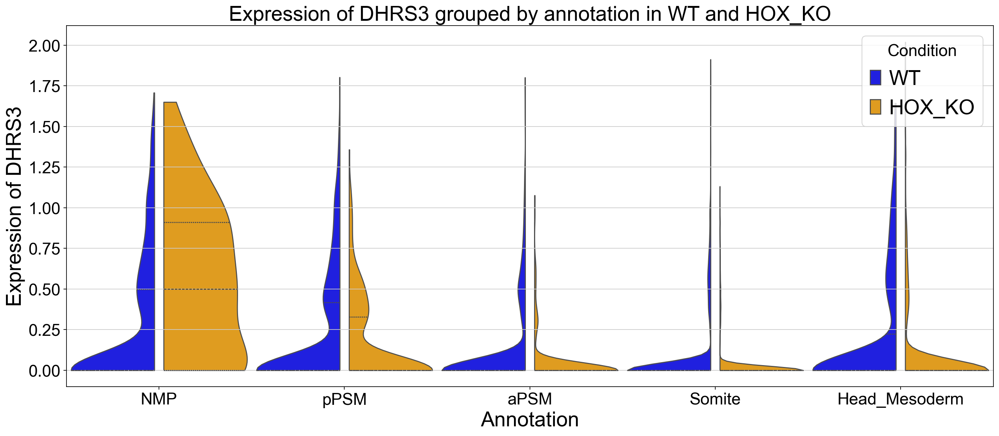

STRA6


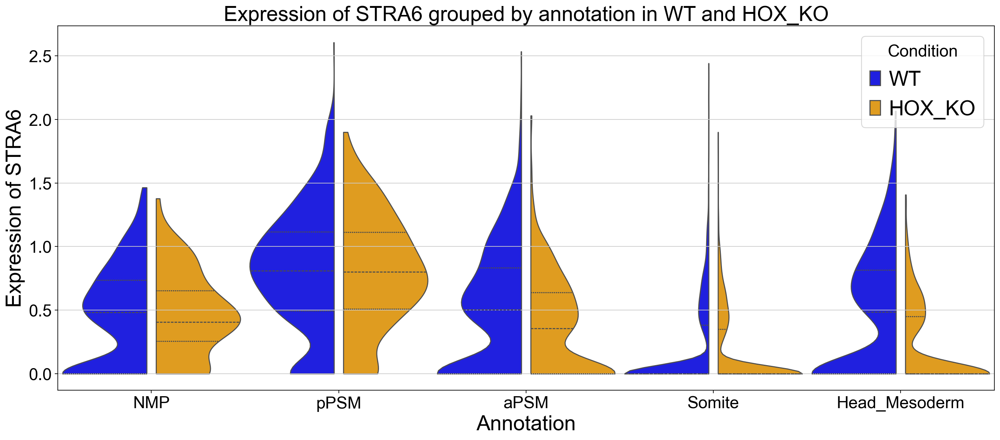

In [46]:
#Split plot of lognorm expression :
gene_of_interest = retinoic_acid_genes

print(gene_of_interest)

# Specify the two conditions you want to compare
condition_1 = 'WT'
condition_2 = 'HOX_KO'

# Filter the AnnData object to include only the two conditions
adata_filtered = adata_subset[adata_subset.obs['sample'].isin([condition_1, condition_2])]

# Define the order of conditions for plotting
condition_order = [condition_1, condition_2]

# Loop through each gene in the list
for gene in gene_of_interest:
    print(gene)
    # Ensure the gene exists in the data
    if gene not in adata_filtered.var_names:
        print(f"Gene {gene} not found in the dataset.")
        continue
    
    # Extract expression data for the gene
    gene_expression = adata_filtered[:, gene].X
    
    # Create a DataFrame with the expression data, condition, and annotation labels
    expression_df = pd.DataFrame({
        'expression': gene_expression.A.flatten() if hasattr(gene_expression, 'A') else gene_expression.flatten(),
        'condition': adata_filtered.obs['sample'],
        'annotation': adata_filtered.obs["annotation_short"]
    })
    
    # Set up the matplotlib figure
    plt.figure(figsize=(20, 8))
    
    # Create a split plot using seaborn, grouped by annotation
    sns.violinplot(x='annotation', y='expression', hue='condition', data=expression_df, inner="quart",gap=0.1, density_norm ="width",
                   split=True, palette={condition_1: 'blue', condition_2: 'orange'}, hue_order=condition_order, width=1, cut=0)
    
    # Customize the plot
    plt.title(f"Expression of {gene} grouped by annotation in {condition_1} and {condition_2}", fontsize=25)
    plt.xlabel("Annotation", fontsize=25)
    plt.ylabel(f"Expression of {gene}",fontsize=25)
    plt.legend(title='Condition',title_fontsize=20, fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    # Save the figure before displaying it
    #file_name = f'figures/RA/20241113{gene}_expression_violinplot_{condition_1}_vs_{condition_2}.pdf'
    #plt.savefig(file_name, format='pdf', dpi=300, bbox_inches='tight')
    
    plt.show()
    


['TBXT', 'FGF4', 'FGF17', 'BMP7', 'TGFB1', 'WNT3A', 'WNT5A', 'WNT8A', 'RSPO3', 'DRAXIN', 'SFRP2', 'PAX3', 'FN1', 'MEST']
TBXT


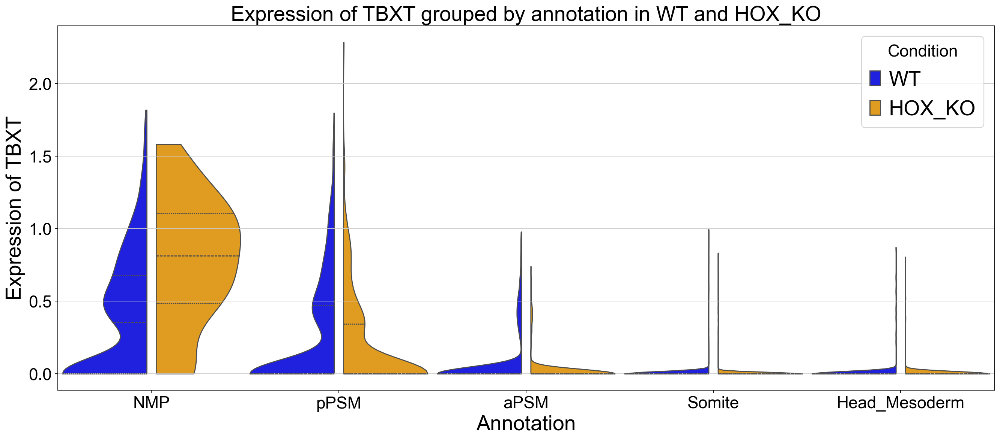

FGF4


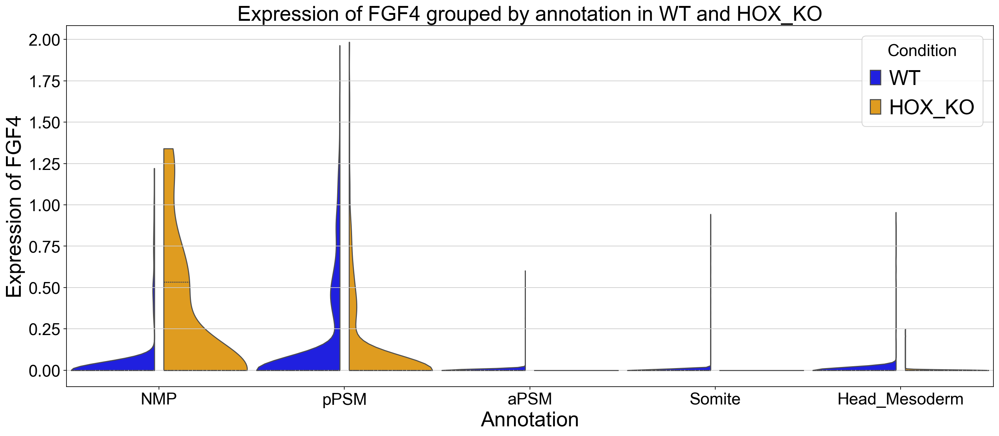

FGF17


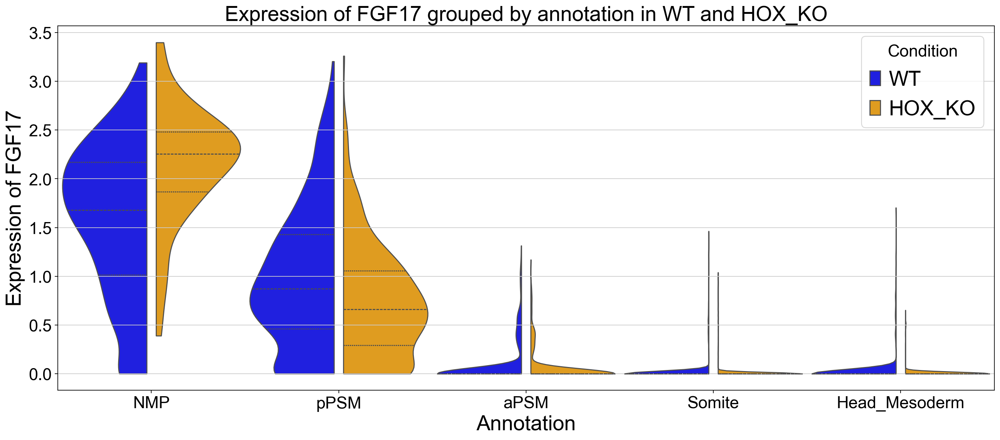

BMP7


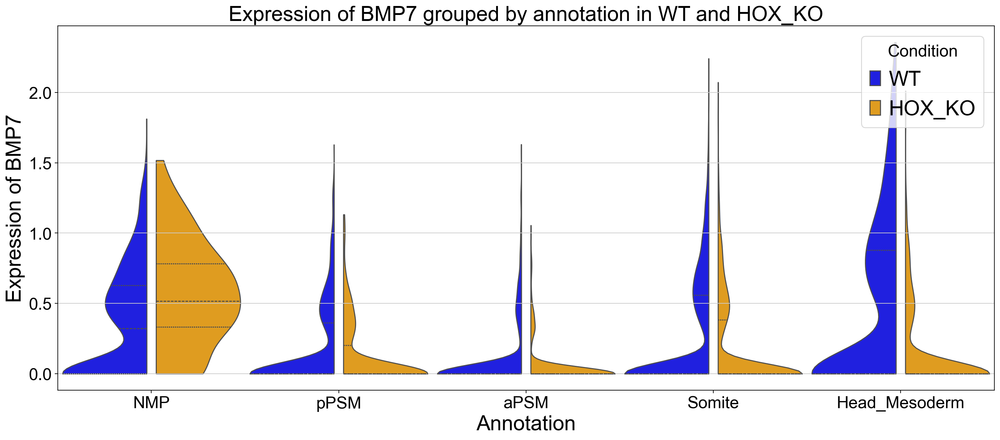

TGFB1


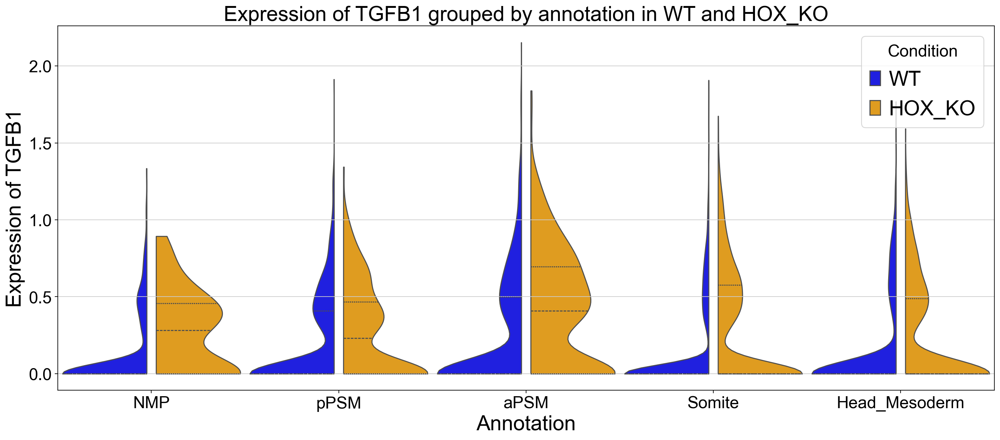

WNT3A


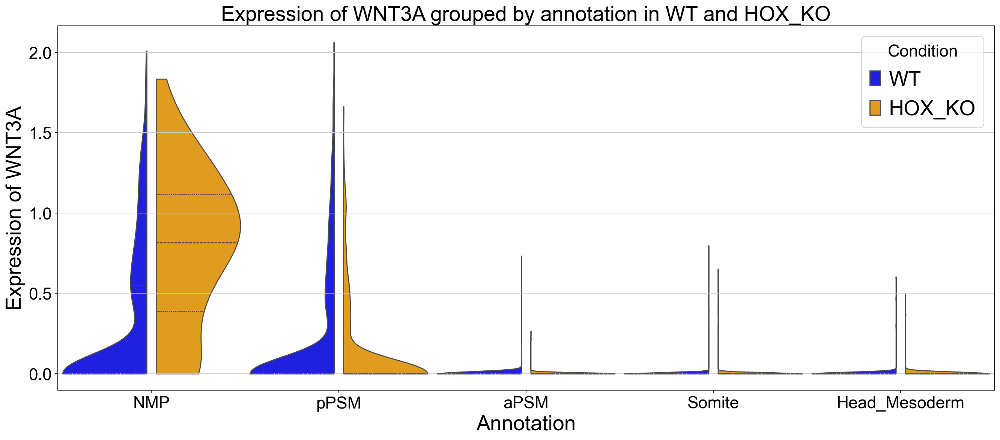

WNT5A


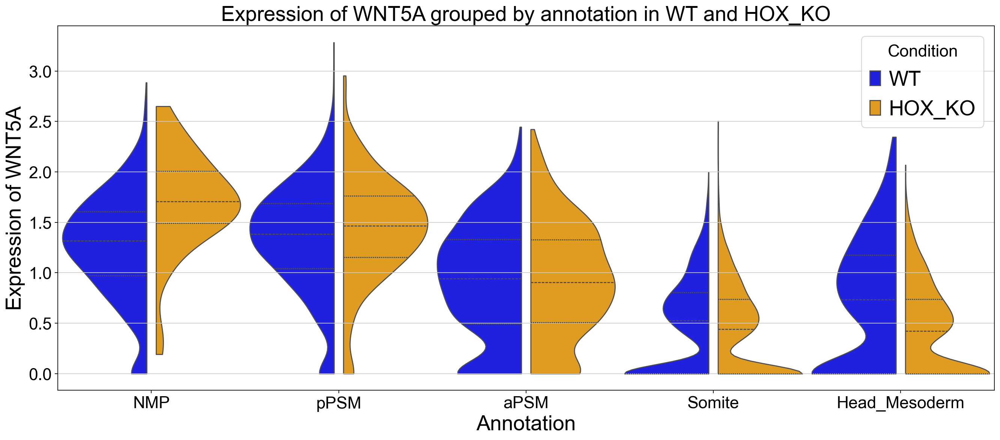

WNT8A


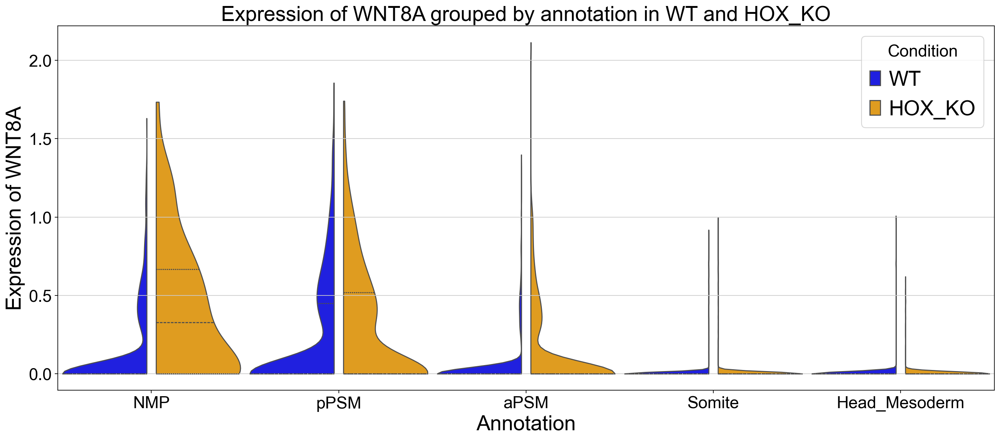

RSPO3


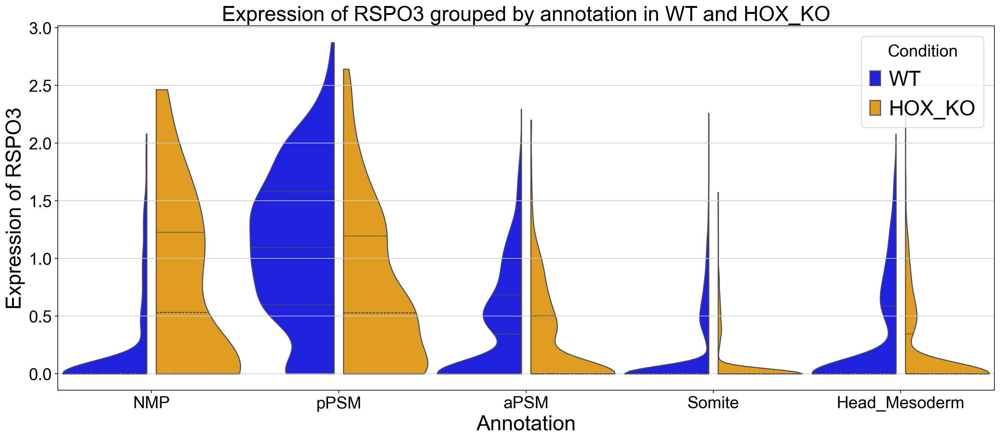

DRAXIN


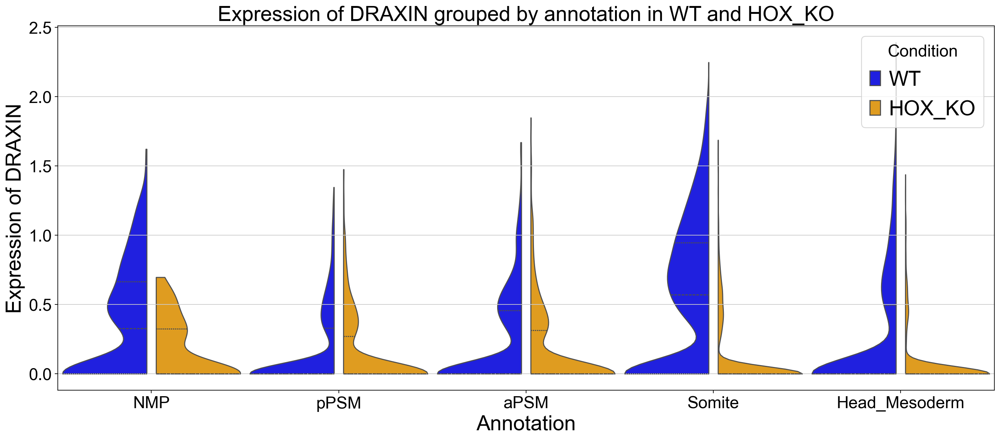

SFRP2


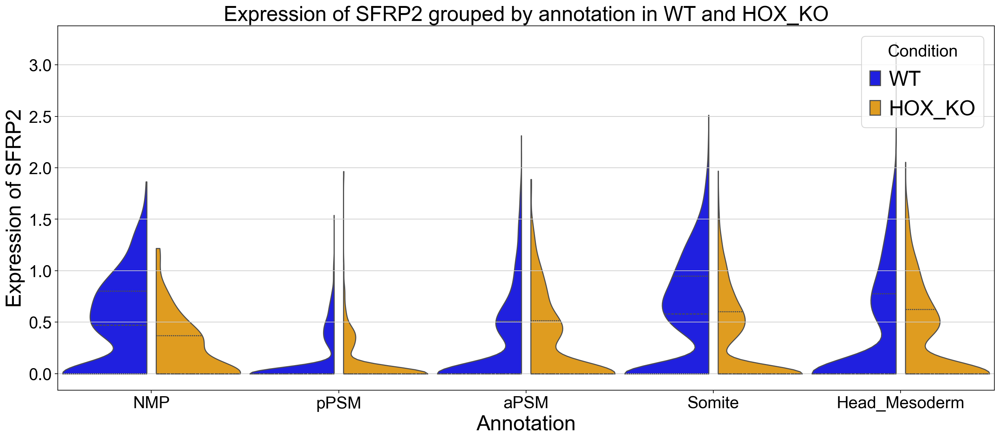

PAX3


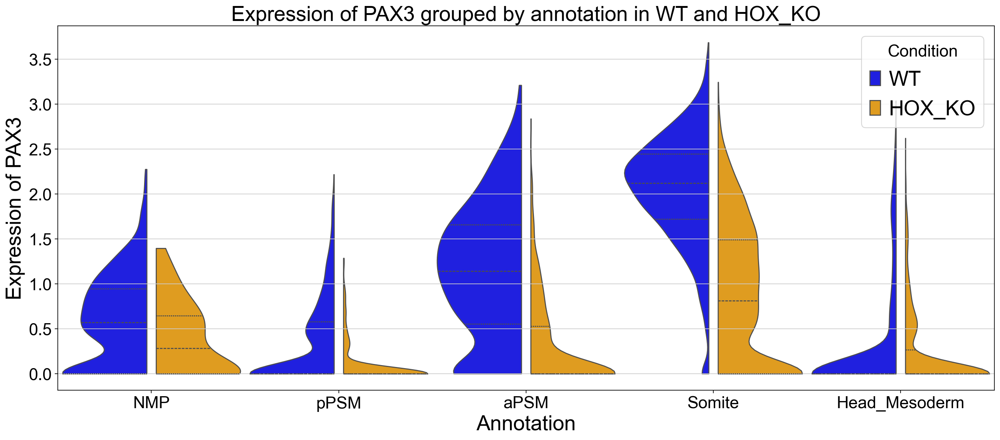

FN1


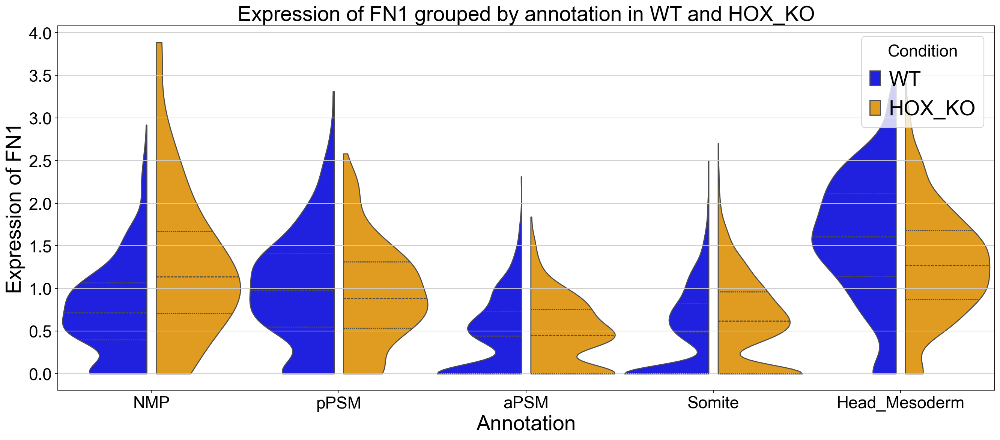

MEST


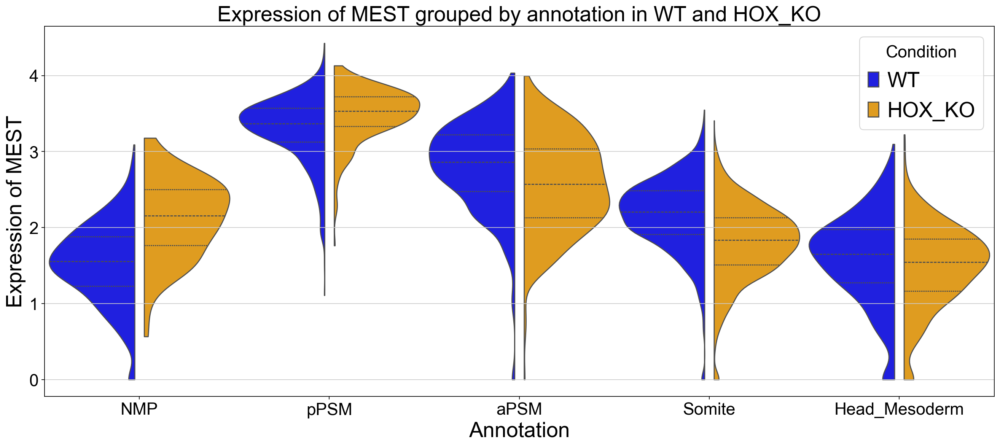

In [47]:
#Split plot of lognorm expression :
gene_of_interest = additional_genes

print(gene_of_interest)

# Specify the two conditions you want to compare
condition_1 = 'WT'
condition_2 = 'HOX_KO'

# Filter the AnnData object to include only the two conditions
adata_filtered = adata_subset[adata_subset.obs['sample'].isin([condition_1, condition_2])]

# Define the order of conditions for plotting
condition_order = [condition_1, condition_2]

# Loop through each gene in the list
for gene in gene_of_interest:
    print(gene)
    # Ensure the gene exists in the data
    if gene not in adata_filtered.var_names:
        print(f"Gene {gene} not found in the dataset.")
        continue
    
    # Extract expression data for the gene
    gene_expression = adata_filtered[:, gene].X
    
    # Create a DataFrame with the expression data, condition, and annotation labels
    expression_df = pd.DataFrame({
        'expression': gene_expression.A.flatten() if hasattr(gene_expression, 'A') else gene_expression.flatten(),
        'condition': adata_filtered.obs['sample'],
        'annotation': adata_filtered.obs["annotation_short"]
    })
    
    # Set up the matplotlib figure
    plt.figure(figsize=(20, 8))
    
    # Create a split plot using seaborn, grouped by annotation
    sns.violinplot(x='annotation', y='expression', hue='condition', data=expression_df, inner="quart",gap=0.1, density_norm ="width",
                   split=True, palette={condition_1: 'blue', condition_2: 'orange'}, hue_order=condition_order, width=1, cut=0)
    
    # Customize the plot
    plt.title(f"Expression of {gene} grouped by annotation in {condition_1} and {condition_2}", fontsize=25)
    plt.xlabel("Annotation", fontsize=25)
    plt.ylabel(f"Expression of {gene}",fontsize=25)
    plt.legend(title='Condition',title_fontsize=20, fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    # Save the figure before displaying it
    #file_name = f'figures/Additional_genes/20241113{gene}_expression_violinplot_{condition_1}_vs_{condition_2}.pdf'
    #plt.savefig(file_name, format='pdf', dpi=300, bbox_inches='tight')
    
    plt.show()
    

    

['TUBB', 'TUBA1A', 'TUBA1B', 'TUBB2A', 'TUBB2B', 'TUBB3', 'TUBB4B']
TUBB


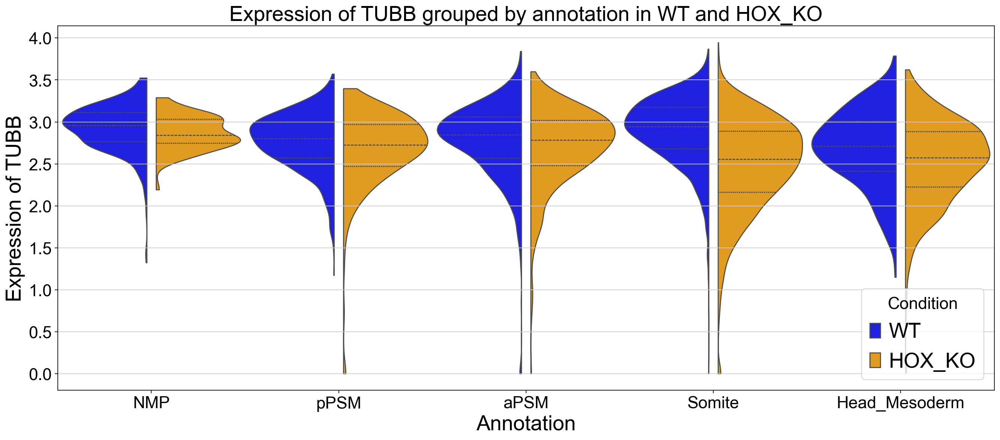

TUBA1A


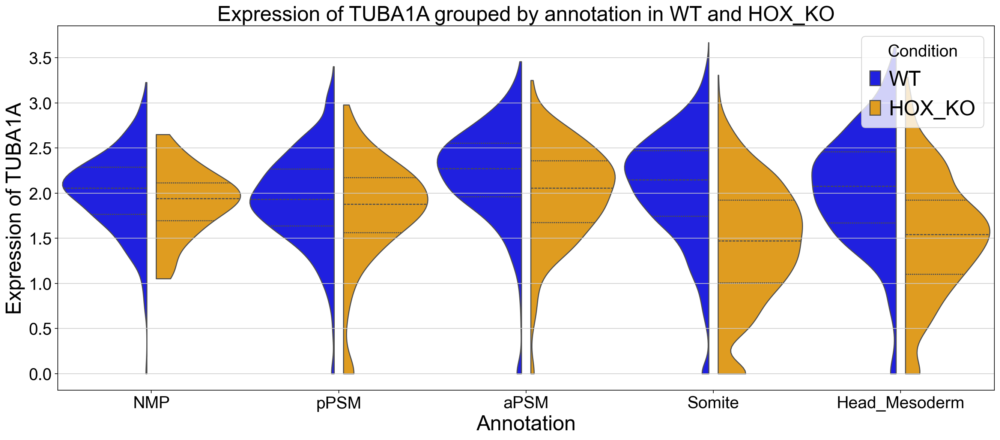

TUBA1B


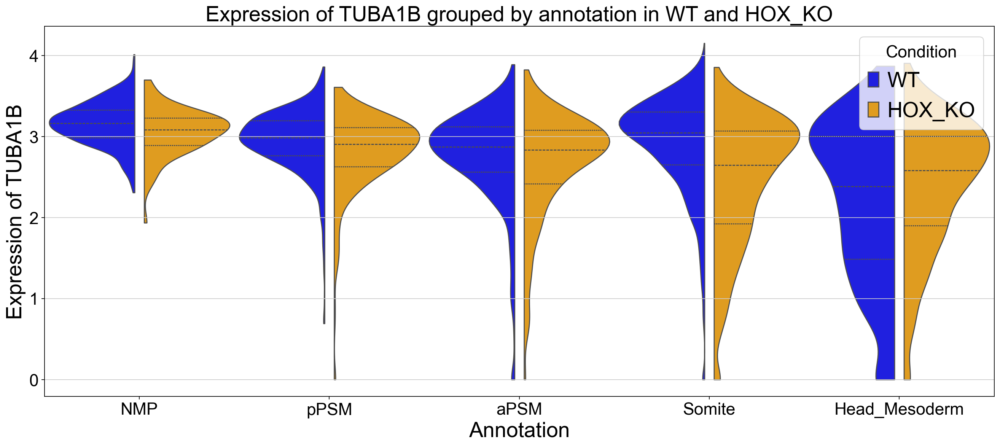

TUBB2A


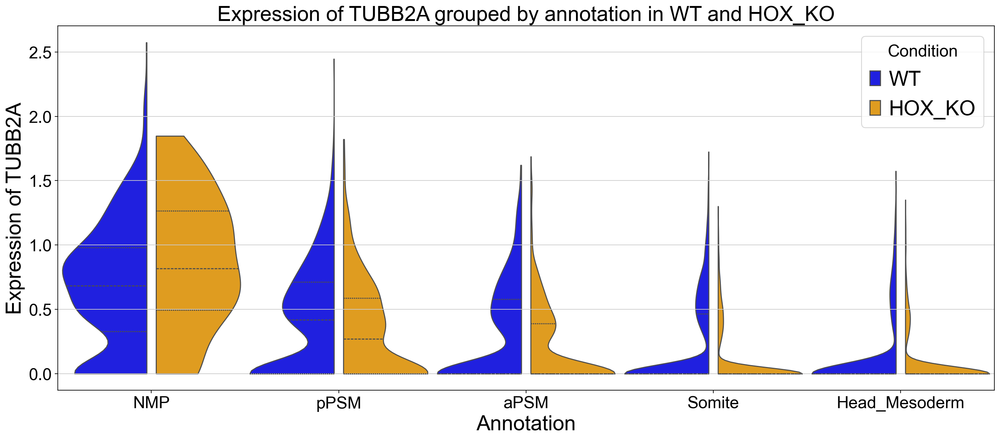

TUBB2B


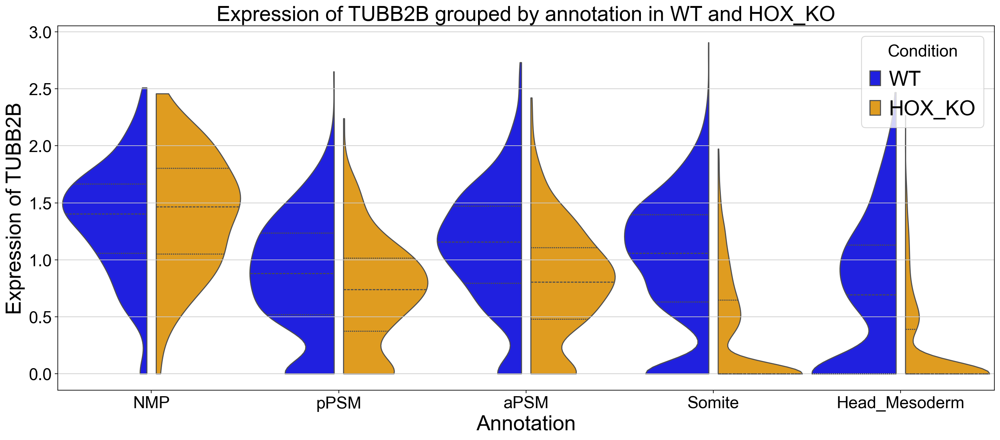

TUBB3


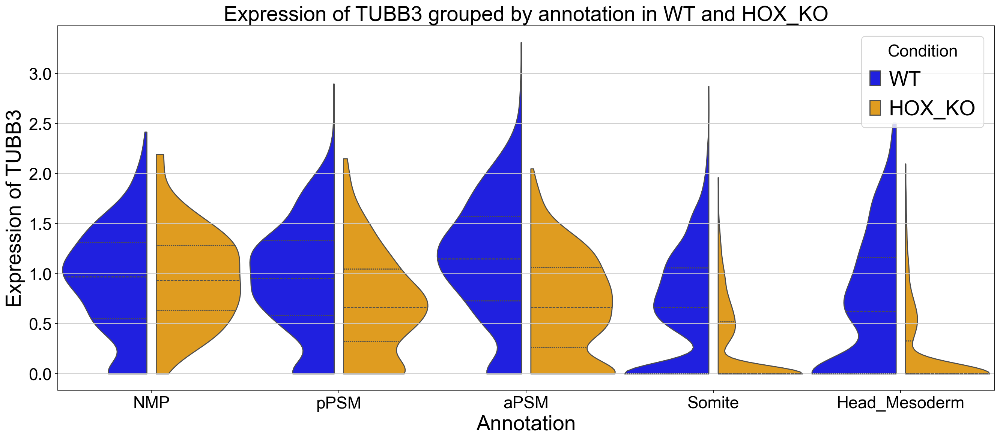

TUBB4B


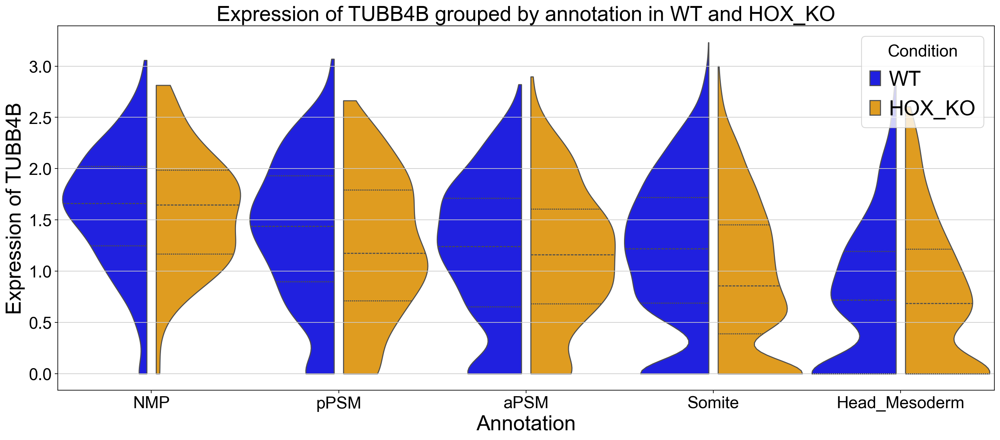

In [48]:
#Split plot of lognorm expression :
gene_of_interest = TUBB_genes

print(gene_of_interest)

# Specify the two conditions you want to compare
condition_1 = 'WT'
condition_2 = 'HOX_KO'

# Filter the AnnData object to include only the two conditions
adata_filtered = adata_subset[adata_subset.obs['sample'].isin([condition_1, condition_2])]

# Define the order of conditions for plotting
condition_order = [condition_1, condition_2]

# Loop through each gene in the list
for gene in gene_of_interest:
    print(gene)
    # Ensure the gene exists in the data
    if gene not in adata_filtered.var_names:
        print(f"Gene {gene} not found in the dataset.")
        continue
    
    # Extract expression data for the gene
    gene_expression = adata_filtered[:, gene].X
    
    # Create a DataFrame with the expression data, condition, and annotation labels
    expression_df = pd.DataFrame({
        'expression': gene_expression.A.flatten() if hasattr(gene_expression, 'A') else gene_expression.flatten(),
        'condition': adata_filtered.obs['sample'],
        'annotation': adata_filtered.obs["annotation_short"]
    })
    
    # Set up the matplotlib figure
    plt.figure(figsize=(20, 8))
    
    # Create a split plot using seaborn, grouped by annotation
    sns.violinplot(x='annotation', y='expression', hue='condition', data=expression_df, inner="quart",gap=0.1, density_norm ="width",
                   split=True, palette={condition_1: 'blue', condition_2: 'orange'}, hue_order=condition_order, width=1, cut=0)
    
    # Customize the plot
    plt.title(f"Expression of {gene} grouped by annotation in {condition_1} and {condition_2}", fontsize=25)
    plt.xlabel("Annotation", fontsize=25)
    plt.ylabel(f"Expression of {gene}",fontsize=25)
    plt.legend(title='Condition',title_fontsize=20, fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    # Save the figure before displaying it
    #file_name = f'figures/RA/20241113{gene}_expression_violinplot_{condition_1}_vs_{condition_2}.pdf'
    #plt.savefig(file_name, format='pdf', dpi=300, bbox_inches='tight')
    
    plt.show()
    

## Additional stacked violin plots

In [49]:
# As we only intend to do DEG comparing HOX_KO vs WT, let's substract them:
samples_of_interest = ['WT', 'HOX_KO']

# Create a new AnnData object with only the two samples
adata_WT_HOXKO = adata_subset[adata_subset.obs['sample'].isin(samples_of_interest)].copy()

In [50]:
NMP_violin = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'NMP',:].copy()

In [51]:
NMP_violin.obs['sample'] = NMP_violin.obs['sample'].cat.reorder_categories(['WT', 'HOX_KO'])

In [52]:
list_genes = [ "TBXT", "FGF4", "FGF17", "BMP7", "TGFB1", "WNT3A", "WNT5A","WNT8A", "RSPO3", "DRAXIN", "SFRP2"]

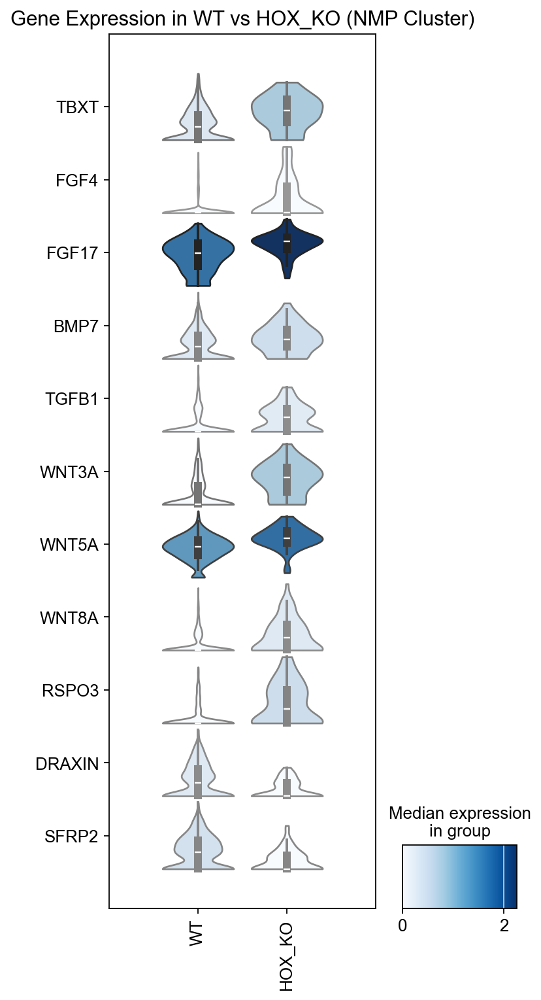

In [53]:
# Create a split violin plot
sc.pl.stacked_violin(
    adata=NMP_violin,
    var_names=list_genes,
    groupby='sample',  # This column should contain 'WT' and 'HOX_KO'
    swap_axes=True,  # Horizontal layout for better readability
    figsize=(5, len(list_genes) * 1),  # Dynamically adjust figure size
    title="Gene Expression in WT vs HOX_KO (NMP Cluster)",
    density_norm="width",
    inner="box",
    linewidth=1.2,
    #save="20241210_NMP_DEGgenes_stackedviolin.pdf"
)

In [54]:
Somite_violin = adata_WT_HOXKO[adata_WT_HOXKO.obs['annotation_short'] == 'Somite',:].copy()

In [55]:
Somite_violin.obs['sample'] = Somite_violin.obs['sample'].cat.reorder_categories(['WT', 'HOX_KO'])

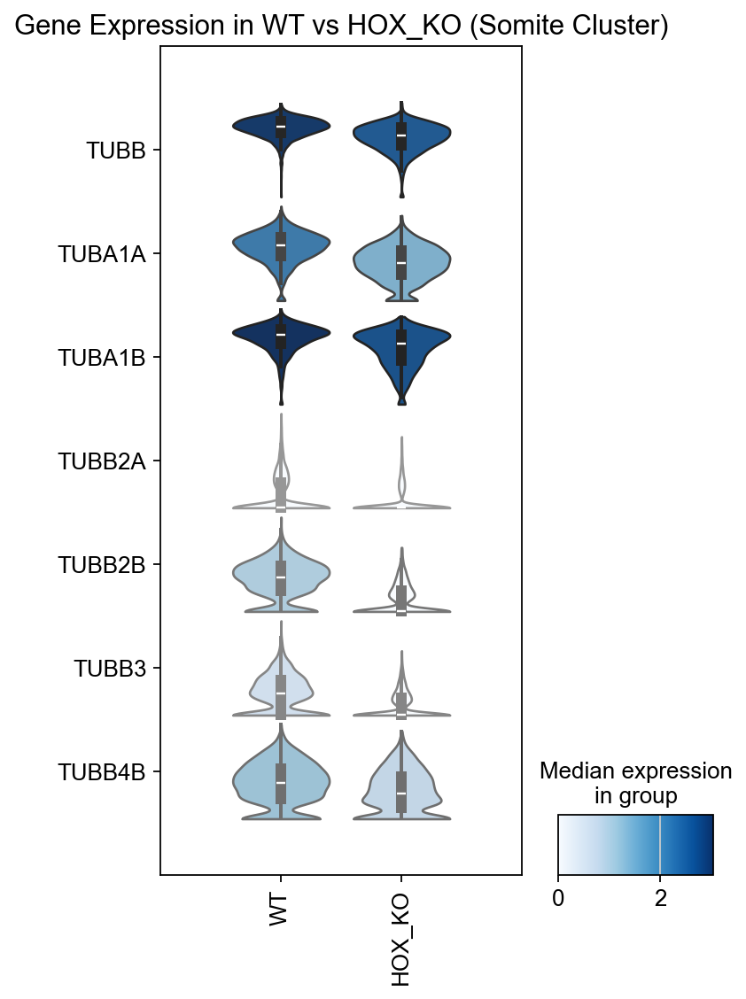

In [56]:
# Create a split violin plot
sc.pl.stacked_violin(
    adata=Somite_violin,
    var_names=TUBB_genes,
    groupby='sample',  # This column should contain 'WT' and 'HOX_KO'
    swap_axes=True,  # Horizontal layout for better readability
    figsize=(5, len(list_genes) * 0.7),  # Dynamically adjust figure size
    title="Gene Expression in WT vs HOX_KO (Somite Cluster)",
    density_norm="width",
    inner="box",
    linewidth=1.2,
    #save="20241210_Somite_DEG_TUBBgenes_stackedviolin.pdf"
)